<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/a/aa/Logo_DuocUC.svg/2560px-Logo_DuocUC.svg.png' width=50%, height=20%>

NOTA : este notebook se basa en A REGRESSION PROJECT IN PYTHON; PREDICT DIAMONDS PRICES BASED ON CUT, COLOR; CLARITY AND OTHER ATRIBUTES, creado por Roi Polanitzer.

https://medium.com/@polanitzer/a-regression-project-in-python-predict-diamonds-prices-based-on-cut-color-clarity-and-other-d856c0ba9a2c


# FASE 1 : COMPRENDER EL NEGOCIO

De Beers es la Compañia de diamantes más grande del mundo.
De Beers necesita saber el precio de mercado actualizado (en
dólares estaunidenses) de cualquier diamante que venda.

Se necesita crear un modelo que prediga, con un alto nivel de
precisión, el precio de mercado en dólares estaunidenses de un
diamante al relacionar los precios de los diamantes vendidos
anteriormente.


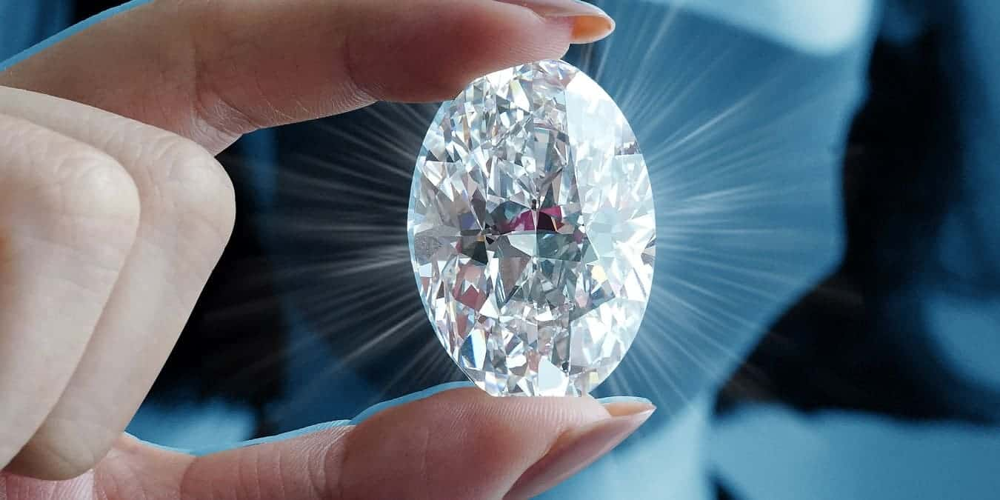

 The 4Cs of diamonds:
* cut
* color
* clarity
* carat



CUT

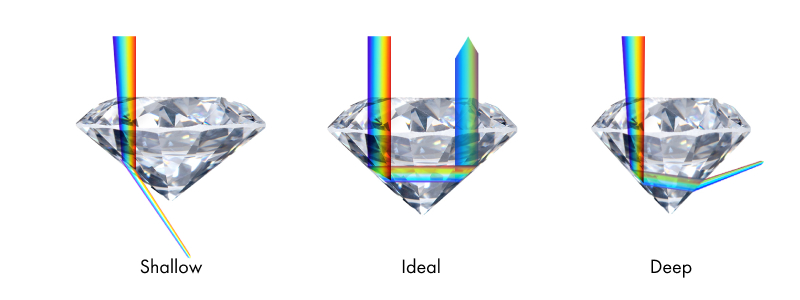

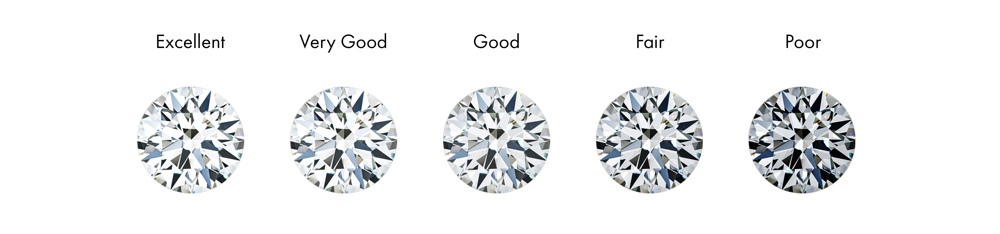

COLOR

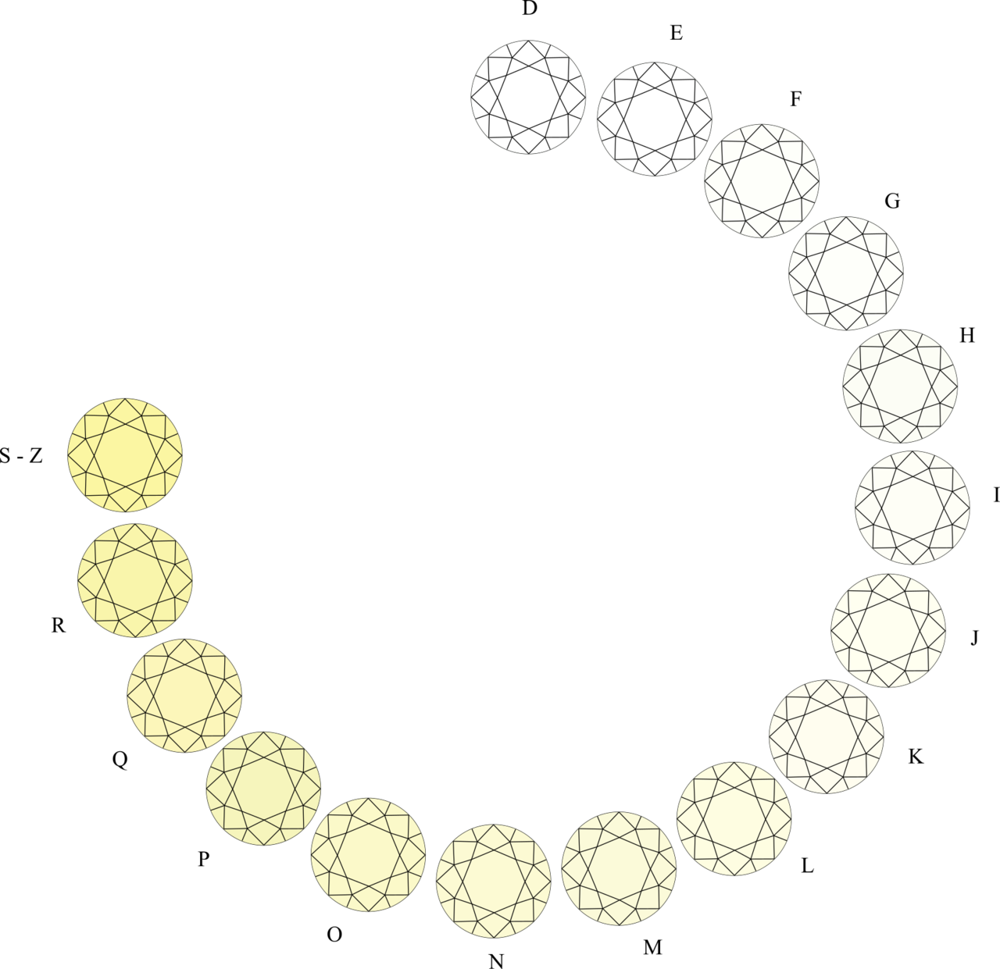

CLARITY

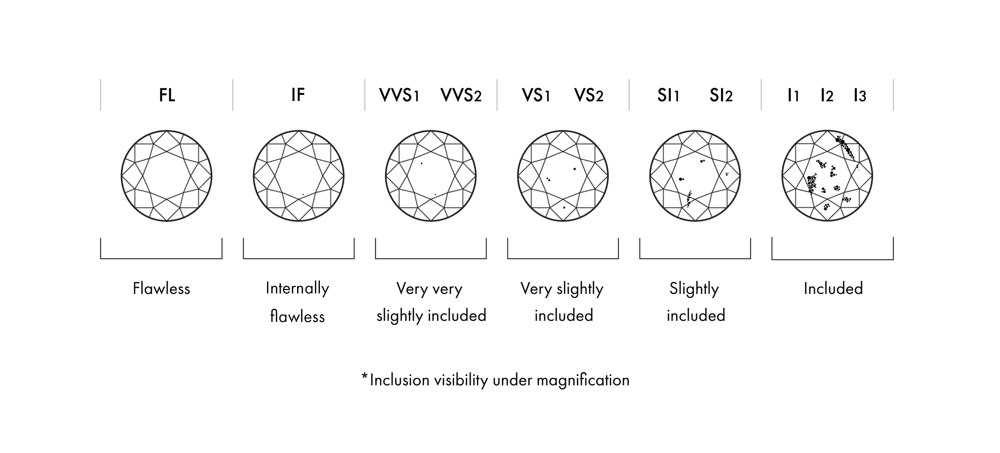

Diamond clarity ratings and the clarity scale
*FL - Flawless*      
FL diamonds are Flawless with no internal or external imperfections visible to a skilled grader under 10-power magnification.

*IF - Internally flawless *   
IF diamonds are Internally Flawless but may have small surface blemishes visible under magnification.
VVS1 - Very, very slightly included, first degree
VVS diamonds are Very, Very Slightly Included with tiny inclusions that are difficult to see even under magnification. The “1” in this rating puts these particular diamonds at the top of their grade.

*VVS2 - Very, very slightly included, second degree*  
VVS diamonds are Very, Very Slightly Included with tiny inclusions that are difficult to see even under magnification. The “2” in this ranking means that they are just beneath the VVS1 rating.

*VS1 - Very slightly included, first degree*  
VS diamonds are Very Slightly Included with minor inclusions that range from difficult (VS1) to easier (VS2) to see under magnification. The “1” in this rating makes them slightly superior to VS2 diamonds.

*VS2 - Very slightly included, second degree*  
VS diamonds are Very Slightly Included with minor inclusions that range from difficult (VS1) to easier (VS2) to see under magnification. The “2” in this rating puts them just below VSI diamonds.

SI1 - Slightly included, first degree *
SI diamonds are “Slightly Included.” Inclusions might not be visible to the naked eye, but are easy to see when under magnification. The “1” in this rating makes them slightly superior to SI2 diamonds.

*SI2 - Slightly included, second degree*  
SI diamonds are “Slightly Included.” Inclusions might not be visible to the naked eye, but are easy to see when under magnification. The “2” in this rating makes them slightly inferior to SI1 diamonds.

CARAT

Diamond carat refers to how much a diamond weighs. A carat is the unit of measurement for a diamond’s weight.

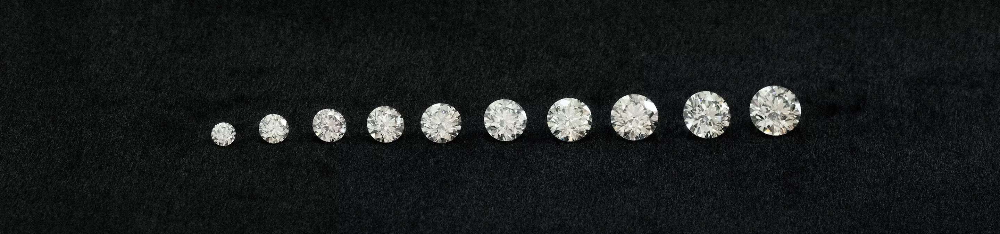



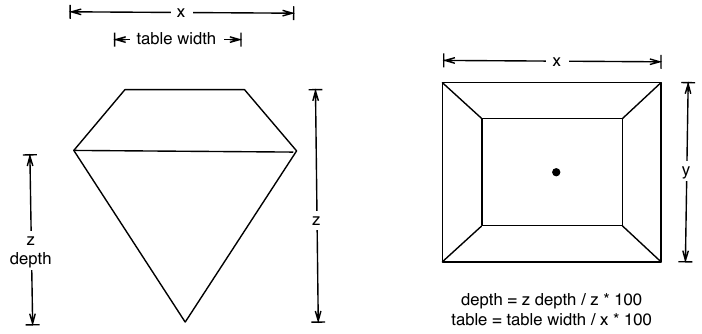

Referencias:

https://www.vrai.com/journal/post/what-is-diamond-carat  
https://www.vrai.com/journal/post/diamond-cut   
https://www.vrai.com/journal/post/diamond-clarity-chart  

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [6]:
# **
# Leer el archivo Diamons.csv
#
from google.colab import files
uploaded = files.upload()
for fn in uploaded.keys():
    name=fn
df = pd.read_csv(name, sep=",")

Saving Diamonds.csv to Diamonds.csv


# FASE 2 : COMPRENDER LO DATOS

In [7]:
df.shape

(53940, 11)

In [8]:
df.columns

Index(['Unnamed: 0', 'carat', 'cut', 'color', 'clarity', 'depth', 'table',
       'price', 'x', 'y', 'z'],
      dtype='object')

In [9]:
df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [11]:
df.isna().sum()

,0
Unnamed: 0,0
carat,0
cut,0
color,0
clarity,0
depth,0
table,0
price,0
x,0
y,0


In [12]:
# Usaremos un método resumen de estadísticas numéricas
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,53940.0,26970.500000,15571.281097,1.0,13485.75,26970.50,40455.25,53940.00
carat,53940.0,0.797940,0.474011,0.2,0.40,0.70,1.04,5.01
depth,53940.0,61.749405,1.432621,43.0,61.00,61.80,62.50,79.00
table,53940.0,57.457184,2.234491,43.0,56.00,57.00,59.00,95.00
price,53940.0,3932.799722,3989.439738,326.0,950.00,2401.00,5324.25,18823.00
x,53940.0,5.731157,1.121761,0.0,4.71,5.70,6.54,10.74
y,53940.0,5.734526,1.142135,0.0,4.72,5.71,6.54,58.90
z,53940.0,3.538734,0.705699,0.0,2.91,3.53,4.04,31.80


In [13]:
# Las filas de conteo, media, mínimo y máximo se explican por sí mismas.
# El std muestra la desviación estándar y las filas 25%, 50% y 75% muestran los percentiles correspondientes.

In [14]:
# MODIFICADO
# One hot encoding para las variables cut, color, clarity
# df_ohe = pd.get_dummies(df, columns=["cut", "color", "clarity"])

In [15]:
df.columns

df2 = df.drop(['Unnamed: 0'],axis=1)  # MODIFICADO


In [16]:
df2.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [17]:
corr_matrix = df2[['carat', 'depth', 'table', 'price', 'x', 'y','z']].corr()
corr_matrix["price"].sort_values(ascending=False)


,price
price,1.000000
carat,0.921591
x,0.884435
y,0.865421
z,0.861249
table,0.127134
depth,-0.010647


In [18]:
df2.query('x==0 or y==0 or z==0')

,carat,cut,color,clarity,depth,table,price,x,y,z
2207,1.00,Premium,G,SI2,59.1,59.0,3142,6.55,6.48,0.0
2314,1.01,Premium,H,I1,58.1,59.0,3167,6.66,6.60,0.0
4791,1.10,Premium,G,SI2,63.0,59.0,3696,6.50,6.47,0.0
5471,1.01,Premium,F,SI2,59.2,58.0,3837,6.50,6.47,0.0
10167,1.50,Good,G,I1,64.0,61.0,4731,7.15,7.04,0.0
11182,1.07,Ideal,F,SI2,61.6,56.0,4954,0.00,6.62,0.0
11963,1.00,Very Good,H,VS2,63.3,53.0,5139,0.00,0.00,0.0
13601,1.15,Ideal,G,VS2,59.2,56.0,5564,6.88,6.83,0.0
15951,1.14,Fair,G,VS1,57.5,67.0,6381,0.00,0.00,0.0
24394,2.18,Premium,H,SI2,59.4,61.0,12631,8.49,8.45,0.0


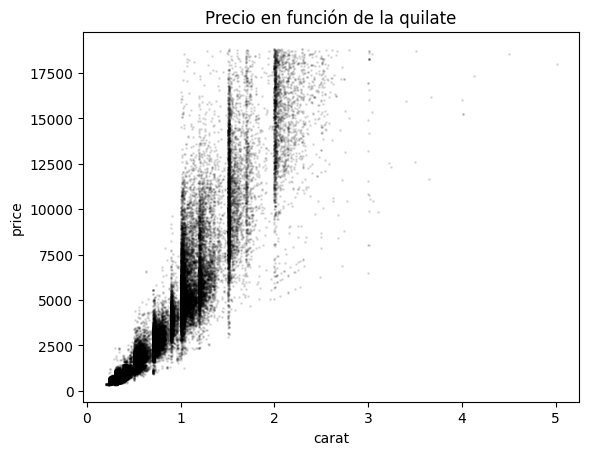

In [19]:
plt.scatter(x=df2["carat"] , y=df2["price"], s=1, alpha=0.1, c="black");
plt.xlabel("carat")
plt.ylabel("price")
plt.title("Precio en función de la quilate");

Observamos que para determinar el valor de un diamante, "carat" no es lo unico importante.

In [21]:
len(df2.query('carat > 3'))

32

In [22]:
len(df2.query('carat > 2'))

1889

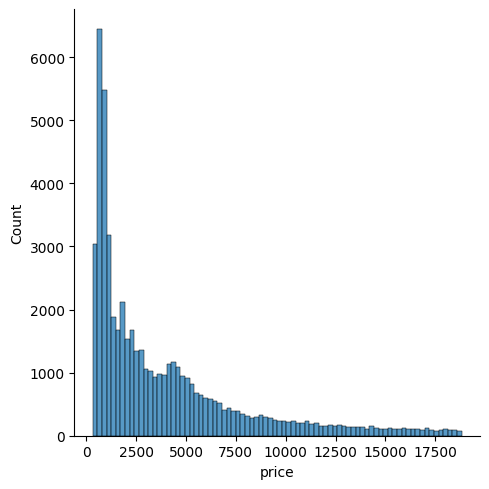

In [23]:
sns.displot(df2.price);  # MOD

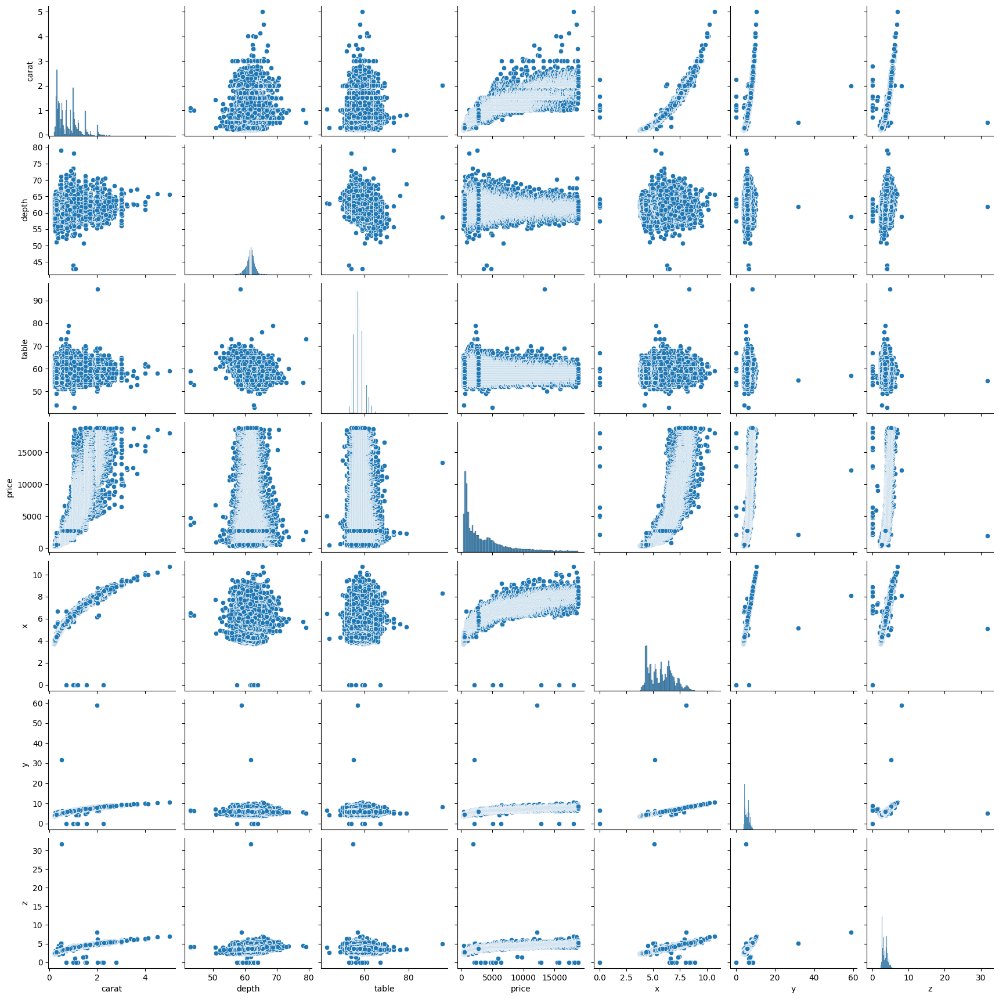

In [24]:
sns.pairplot(df2)

En el diagrama se observa la relaciones entre todas las variables numéricas. De los gráficos podemos ver las relaciones entre las variables, y observamos que varias de ellas tienen una influencia en el precio. También se observa que hay algunos puntos que se alejan de la distribución general (outliers). Pensamos que quizás sería conveninente eliminarlos de nuestro conjunto de datos, ya que son casos extremos y están fuera del alcance de nuestro proyecto.

# FASE 3 : PREPARAR LOS DATOS

In [25]:
# Remover outliers
df2.query('z>10 or y>10')

,carat,cut,color,clarity,depth,table,price,x,y,z
24067,2.00,Premium,H,SI2,58.9,57.0,12210,8.09,58.90,8.06
25998,4.01,Premium,I,I1,61.0,61.0,15223,10.14,10.10,6.17
27415,5.01,Fair,J,I1,65.5,59.0,18018,10.74,10.54,6.98
27630,4.50,Fair,J,I1,65.8,58.0,18531,10.23,10.16,6.72
48410,0.51,Very Good,E,VS1,61.8,54.7,1970,5.12,5.15,31.80
49189,0.51,Ideal,E,VS1,61.8,55.0,2075,5.15,31.80,5.12


In [26]:
df2.query('z>10 or y>10').index

Index([24067, 25998, 27415, 27630, 48410, 49189], dtype='int64')

In [27]:
df2.drop(df2.query('z>10 or y>10').index, inplace=True)

In [28]:
df2.query('x==0 or y==0 or z==0')

,carat,cut,color,clarity,depth,table,price,x,y,z
2207,1.00,Premium,G,SI2,59.1,59.0,3142,6.55,6.48,0.0
2314,1.01,Premium,H,I1,58.1,59.0,3167,6.66,6.60,0.0
4791,1.10,Premium,G,SI2,63.0,59.0,3696,6.50,6.47,0.0
5471,1.01,Premium,F,SI2,59.2,58.0,3837,6.50,6.47,0.0
10167,1.50,Good,G,I1,64.0,61.0,4731,7.15,7.04,0.0
11182,1.07,Ideal,F,SI2,61.6,56.0,4954,0.00,6.62,0.0
11963,1.00,Very Good,H,VS2,63.3,53.0,5139,0.00,0.00,0.0
13601,1.15,Ideal,G,VS2,59.2,56.0,5564,6.88,6.83,0.0
15951,1.14,Fair,G,VS1,57.5,67.0,6381,0.00,0.00,0.0
24394,2.18,Premium,H,SI2,59.4,61.0,12631,8.49,8.45,0.0


In [29]:
df2.query('x==0 or y==0 or z==0').index

Index([ 2207,  2314,  4791,  5471, 10167, 11182, 11963, 13601, 15951, 24394,
       24520, 26123, 26243, 27112, 27429, 27503, 27739, 49556, 49557, 51506],
      dtype='int64')

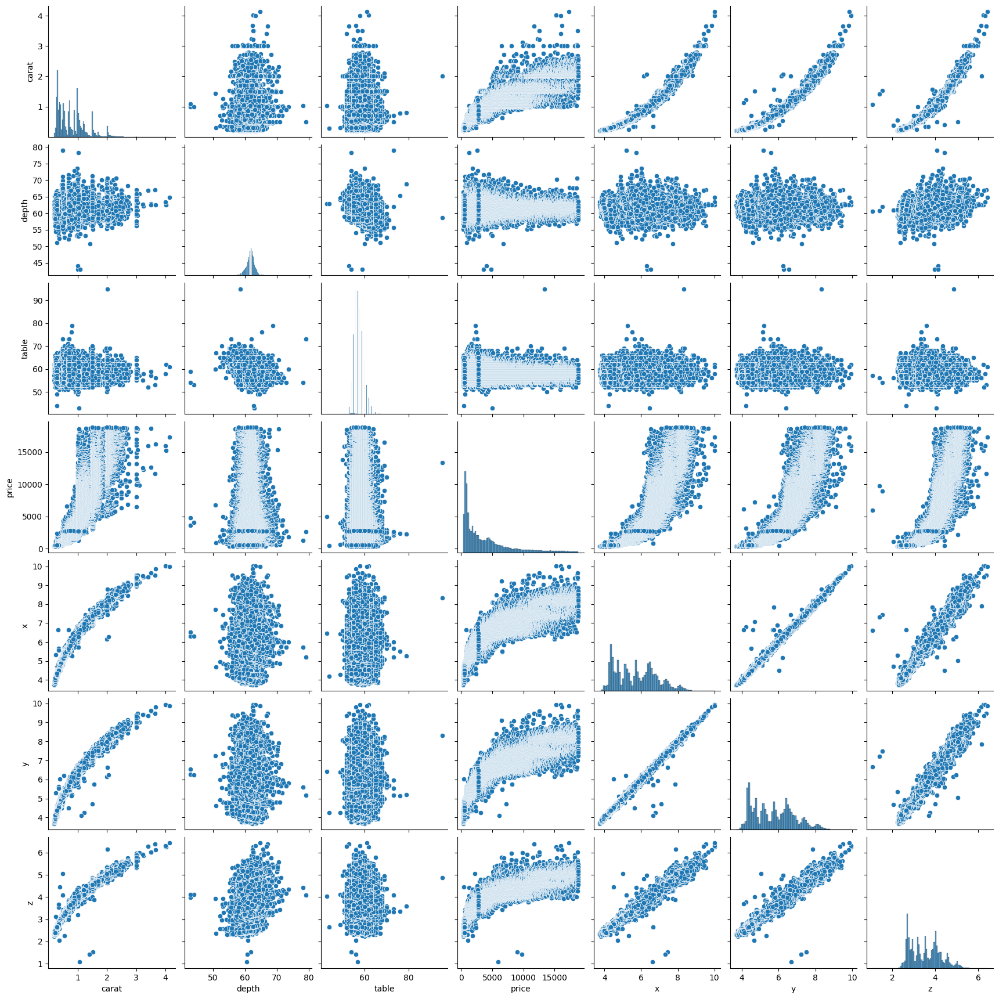

In [30]:
df2.drop(df2.query("x==0 or y==0 or z==0").index, inplace=True)
sns.pairplot(df2)

NOtamos que eliminar los valores extremos nos han permitido observar mejor las relaciones entre las diferentes variables

In [31]:
df2.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


Ahora consideramos que podemos crear una nueva variable que capture los valores de x, y y z, la cual llamaremos vol y que corresponderá al volumen del paralelepipedo que contiene al diamante.

In [32]:
df2["vol"] = df.x * df.y * df.z
df2.head()


,carat,cut,color,clarity,depth,table,price,x,y,z,vol
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43,38.202030
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31,34.505856
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31,38.076885
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63,46.724580
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75,51.917250


In [33]:
df2.drop(["x","y","z"], axis=1, inplace=True)
df2.head()


,carat,cut,color,clarity,depth,table,price,vol
0,0.23,Ideal,E,SI2,61.5,55.0,326,38.202030
1,0.21,Premium,E,SI1,59.8,61.0,326,34.505856
2,0.23,Good,E,VS1,56.9,65.0,327,38.076885
3,0.29,Premium,I,VS2,62.4,58.0,334,46.724580
4,0.31,Good,J,SI2,63.3,58.0,335,51.917250


In [34]:
# Creación de variables Dummy
df["cut"].unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

In [35]:
df2.cut.replace({"Ideal":5, "Premium":4, "Good":2, "Very Good":3, "Fair":1}, inplace=True)
df2.head()

<ipython-input-35-ae9e3967d464>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df2.cut.replace({"Ideal":5, "Premium":4, "Good":2, "Very Good":3, "Fair":1}, inplace=True)
<ipython-input-35-ae9e3967d464>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.cut.replace({"Ideal":5, "Premium":4, "Good"

,carat,cut,color,clarity,depth,table,price,vol
0,0.23,5,E,SI2,61.5,55.0,326,38.202030
1,0.21,4,E,SI1,59.8,61.0,326,34.505856
2,0.23,2,E,VS1,56.9,65.0,327,38.076885
3,0.29,4,I,VS2,62.4,58.0,334,46.724580
4,0.31,2,J,SI2,63.3,58.0,335,51.917250


In [36]:
df2.color.unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [37]:
df2.color.replace({"E":2, "I":6, "J":7, "H":5, "F":3, "G":4, "D":1}, inplace=True)
df2.head()

<ipython-input-37-9e52fb33982a>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df2.color.replace({"E":2, "I":6, "J":7, "H":5, "F":3, "G":4, "D":1}, inplace=True)
<ipython-input-37-9e52fb33982a>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.color.replace({"E":2, "I":6, "J":7, "H":5, "F":3, "

,carat,cut,color,clarity,depth,table,price,vol
0,0.23,5,2,SI2,61.5,55.0,326,38.202030
1,0.21,4,2,SI1,59.8,61.0,326,34.505856
2,0.23,2,2,VS1,56.9,65.0,327,38.076885
3,0.29,4,6,VS2,62.4,58.0,334,46.724580
4,0.31,2,7,SI2,63.3,58.0,335,51.917250


In [38]:
df2.clarity.unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [39]:
df2.clarity.replace({"SI2":1, "SI1":2, "VS1":3, "VS2":4, "VVS2":5, "VVS1":6, "I1":7, "IF":8}, inplace=True)
df2.head()

<ipython-input-39-01387997b586>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df2.clarity.replace({"SI2":1, "SI1":2, "VS1":3, "VS2":4, "VVS2":5, "VVS1":6, "I1":7, "IF":8}, inplace=True)
<ipython-input-39-01387997b586>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2.clarity.replace({"SI2":1, 

,carat,cut,color,clarity,depth,table,price,vol
0,0.23,5,2,1,61.5,55.0,326,38.202030
1,0.21,4,2,2,59.8,61.0,326,34.505856
2,0.23,2,2,3,56.9,65.0,327,38.076885
3,0.29,4,6,4,62.4,58.0,334,46.724580
4,0.31,2,7,1,63.3,58.0,335,51.917250


In [40]:
# Separamos en Train y Test
X = df2.drop(["price"], axis=1)
X.head()

,carat,cut,color,clarity,depth,table,vol
0,0.23,5,2,1,61.5,55.0,38.202030
1,0.21,4,2,2,59.8,61.0,34.505856
2,0.23,2,2,3,56.9,65.0,38.076885
3,0.29,4,6,4,62.4,58.0,46.724580
4,0.31,2,7,1,63.3,58.0,51.917250


In [41]:
y = df2["price"]
y.head()

,price
0,326
1,326
2,327
3,334
4,335


## Separamos en conjunto de

In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# FASE 4: MODELAMIENTO

Atención : se usarán conceptos aún no vistos

In [43]:
# Se usara una Regresión Lineal, uno de los modelos más comunes.
#
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_train, y_train)

LinearRegression()

In [44]:
print("R squared of the Linear Regression on training set: {:.2%}".format(linreg.score(X_train, y_train)))
print("R squared of the Linear Regression on test set: {:.2%}".format(linreg.score(X_test, y_test)))

R squared of the Linear Regression on training set: 88.40%
R squared of the Linear Regression on test set: 88.54%


In [45]:
# La R al cuadrado del conjunto de entrenamiento es casi igual a la R al cuadrado del conjunto de prueba.
# Esto es un indicativo de que nuestro modelo de regresión lineal no se está sobreajustando y, por lo tanto,
# se está generalizando bien a los datos nuevos.
# Además, en nuestro modelo de regresión lineal, el 88,54 % de la variabilidad en los precios de los diamantes
# puede explicarse utilizando las 7 características que elegimos
# (es decir, quilate, corte, color, claridad, tabla, profundidad y volumen). Esto es muy bueno.

(-5000.0, 5000.0)

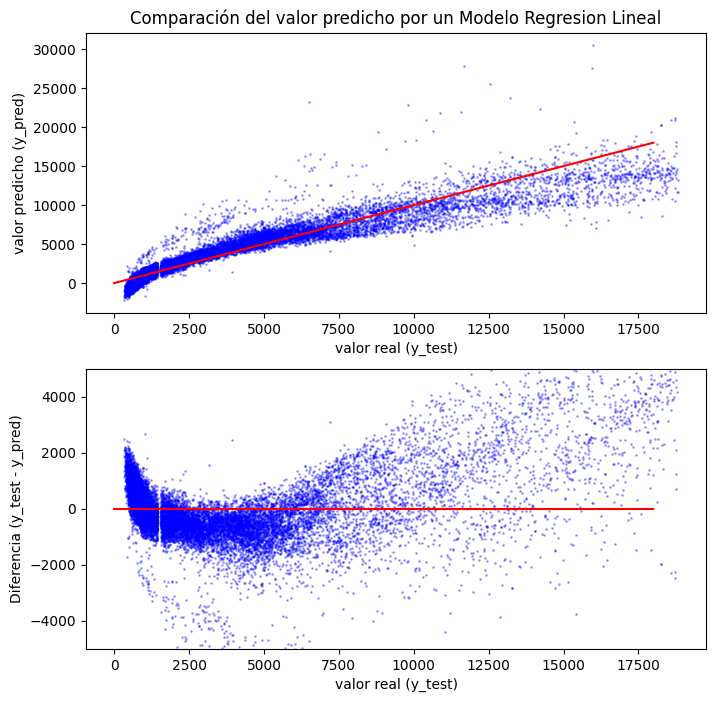

In [46]:
y_pred = linreg.predict(X_test)

fig = plt.figure(figsize=(8, 8))
plt.subplot(211)
plt.scatter(x=y_test , y=y_pred, s=1, alpha=0.3, color="blue")
plt.plot([0., 18000], [0., 18000], color="red")
plt.xlabel("valor real (y_test)")
plt.ylabel("valor predicho (y_pred)")
plt.title("Comparación del valor predicho por un Modelo Regresion Lineal")
plt.subplot(212)
plt.scatter(x=y_test , y=y_test-y_pred, s=1, alpha=0.3, color="blue")
plt.plot([0., 18000], [0., 0.], color="red")
plt.xlabel("valor real (y_test)")
plt.ylabel("Diferencia (y_test - y_pred)")
plt.ylim(-5_000, 5_000)



In [47]:
# Usaremos otro modelo, un árbol de decisión para regresión
#
from sklearn.tree import DecisionTreeRegressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [48]:
print("R squared of the Decision Tree Regressor on training set: {:.2%}".format(tree.score(X_train, y_train)))
print("R squared of the Decision Tree Regressor on test set: {:.2%}".format(tree.score(X_test, y_test)))

R squared of the Decision Tree Regressor on training set: 99.99%
R squared of the Decision Tree Regressor on test set: 96.73%


La R cuadrada en el conjunto de entrenamiento es un poco más alta que la R cuadrada en el conjunto de prueba,
pero eso no significa que nuestro modelo de regresor del árbol de decisión esté sobreajustado.
Por el contrario, nuestro modelo de regresor de árbol de decisión se está generalizando bien a nuevos datos.
Además, en nuestro modelo de regresor de árbol de decisiones, el 96,73 % de la variabilidad en los precios
de los diamantes se puede explicar utilizando las 7 características que elegimos
(es decir, quilate, corte, color, claridad, tabla, profundidad y volumen). Esto es excelente.

(-5000.0, 5000.0)

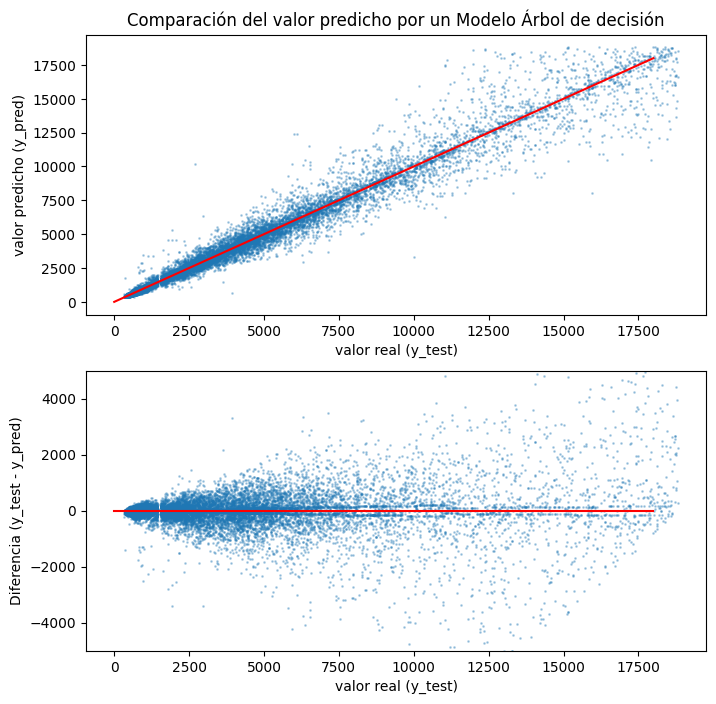

In [49]:
y_pred1 = tree.predict(X_test)
fig = plt.figure(figsize=(8, 8))
plt.subplot(211)
plt.scatter(x=y_test , y=y_pred1, s=1, alpha=0.3, color="C00")
plt.plot([0., 18000], [0., 18000], color="red")
plt.xlabel("valor real (y_test)")
plt.ylabel("valor predicho (y_pred)")
plt.title("Comparación del valor predicho por un Modelo Árbol de decisión")
plt.subplot(212)
plt.scatter(x=y_test , y=y_test-y_pred1, s=1, alpha=0.3, color="C00")
plt.plot([0., 18000], [0., 0.], color="red")
plt.xlabel("valor real (y_test)")
plt.ylabel("Diferencia (y_test - y_pred)")
plt.ylim(-5_000, 5_000)


In [50]:
# Aplicaremos otro modelo: un bosque aleatorio de árboles de decisión
#
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [51]:
print("R squared of the Random Forest Regressor on training set: {:.2%}".format(rf.score(X_train, y_train)))
print("R squared of the Random Forest Regressor on test set: {:.2%}".format(rf.score(X_test, y_test)))

R squared of the Random Forest Regressor on training set: 99.72%
R squared of the Random Forest Regressor on test set: 98.14%


In [52]:
# La R cuadrada en el conjunto de entrenamiento es un poco más alta que la R cuadrada en el conjunto de prueba,
# pero eso no significa que nuestro modelo de regresor de bosque aleatorio esté sobreajustado.
# Por el contrario, nuestro modelo de regresor de bosque aleatorio se está generalizando bien a nuevos datos.
# Además, en nuestro modelo de regresor de bosque aleatorio, el 98,15 % de la variabilidad en los precios
# de los diamantes puede explicarse utilizando las 7 características que elegimos
# (es decir, quilate, corte, color, claridad, tabla, profundidad y volumen). Esto es excelente.

(-5000.0, 5000.0)

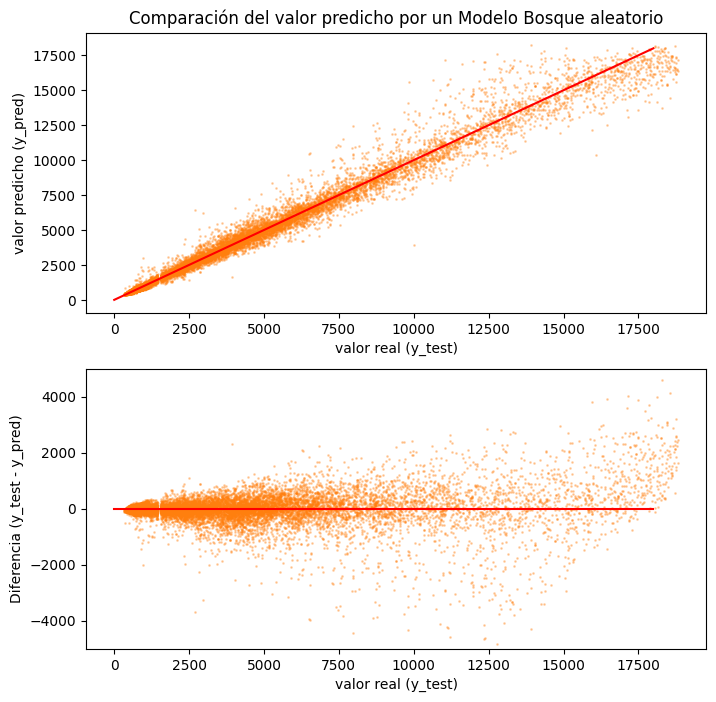

In [53]:
y_pred2 = rf.predict(X_test)
fig = plt.figure(figsize=(8, 8))
plt.subplot(211)
plt.scatter(x=y_test , y=y_pred2, s=1, alpha=0.3, color="C01")
plt.plot([0., 18000], [0., 18000], color="red")
plt.xlabel("valor real (y_test)")
plt.ylabel("valor predicho (y_pred)")
plt.title("Comparación del valor predicho por un Modelo Bosque aleatorio")
plt.subplot(212)
plt.scatter(x=y_test , y=y_test-y_pred2, s=1, alpha=0.3, color="C01")
plt.plot([0., 18000], [0., 0.], color="red")
plt.xlabel("valor real (y_test)")
plt.ylabel("Diferencia (y_test - y_pred)")
plt.ylim(-5_000, 5_000)


# FASE 5 : EVALUACION DE MODELOS

Atención: hay conceptos aún no vistos

In [54]:
# Evaluando el Modelo de Regresión Lineal
#
d = {"true": y_test, "predicted": y_pred}
df_lr = pd.DataFrame(data=d)
df_lr["diff"] = df_lr["predicted"]-df_lr["true"]
df_lr


,true,predicted,diff
35813,914,1680.037661,766.037661
3521,3405,3887.742910,482.742910
42347,1299,502.487251,-796.512749
25602,14456,11832.458049,-2623.541951
9153,4540,5231.824910,691.824910
...,...,...,...
53370,2658,3162.781783,504.781783
47476,1861,2377.920344,516.920344
13818,5630,6284.606583,654.606583
10163,4729,5716.421213,987.421213


In [55]:
from sklearn.metrics import mean_absolute_error
print(f"Mean Absolute Error of the Linear Regression on test set is {mean_absolute_error(y_test, y_pred):.2f}")

Mean Absolute Error of the Linear Regression on test set is 869.38


Nuestro modelo de regresión lineal pudo predecir el precio de cada diamante
en el conjunto de prueba con un error de ± $869.38 del precio real.

In [56]:
from sklearn.metrics import mean_squared_log_error
print(f"Mean Squared Log Error of the Linear Regression on test set is {mean_squared_log_error(y_test,y_pred):.2%}")

ValueError: Mean Squared Logarithmic Error cannot be used when targets contain values less than or equal to -1.

***Este modelo en términos de producto es un mal producto porque no tiene sentido un precio negativo.***

In [57]:
# Evaluando el Modelo de Árbol de Decisión de regresión
#
d = {"true": y_test, "predicted": y_pred1}
df_dt = pd.DataFrame(data=d)
df_dt["diff"] = df_dt["predicted"]-df_dt["true"]
df_dt


,true,predicted,diff
35813,914,914.0,0.0
3521,3405,2956.0,-449.0
42347,1299,990.0,-309.0
25602,14456,16643.0,2187.0
9153,4540,6264.0,1724.0
...,...,...,...
53370,2658,2101.0,-557.0
47476,1861,1793.0,-68.0
13818,5630,5766.0,136.0
10163,4729,5561.0,832.0


In [58]:
print(f"Mean Absolute Error of the Decision Tree Regressor on test set is {mean_absolute_error(y_test,y_pred1):.2f}")

Mean Absolute Error of the Decision Tree Regressor on test set is 354.01


Nuestro modelo de árbol de decisiones para regresión pudo predecir el precio de cada diamante en el conjunto de prueba con un error de ± $ 354.01 del precio real.

In [59]:
print(f"Mean Squared Log Error of the Decision Tree Regressor on test set is {mean_squared_log_error(y_test,y_pred1):.2%}")

Mean Squared Log Error of the Decision Tree Regressor on test set is 2.07%


Nuestro modelo de regresor de árbol de decisión pudo predecir el precio de cada diamante
en el conjunto de prueba con un error de ± 2.07% del precio real.

In [60]:
# # Evaluando el Modelo de Bosque Aleatorio de árboles de decisión
#
d = {"true": y_test, "predicted": y_pred2}
df_rf = pd.DataFrame(data=d)
df_rf["diff"] = df_rf["predicted"]-df_rf["true"]
df_rf


,true,predicted,diff
35813,914,919.685000,5.685000
3521,3405,2951.720000,-453.280000
42347,1299,986.463333,-312.536667
25602,14456,15534.850000,1078.850000
9153,4540,5252.150000,712.150000
...,...,...,...
53370,2658,2394.060000,-263.940000
47476,1861,1861.680000,0.680000
13818,5630,5785.190000,155.190000
10163,4729,5192.800000,463.800000


In [61]:
print(f"Mean Absolute Error of the Random Forest Regressor on test set is {mean_absolute_error(y_test,y_pred2):.2f}")

Mean Absolute Error of the Random Forest Regressor on test set is 277.00


Nuestro modelo de bosque aleatorio pudo predecir el precio de cada diamante
en el conjunto de prueba con un error de ± $ 277 del precio real.

In [62]:
print(f"Mean Squared Log Error of the Random Forest Regressor on test set is {mean_squared_log_error(y_test,y_pred2):.2%}")

Mean Squared Log Error of the Random Forest Regressor on test set is 1.25%


Nuestro modelo  de bosque aleatorio fue capaz de predecir el precio de cada diamante en el conjunto de prueba con un error de ± 1,25 % del precio real.

## Selección del modelo

Elegimos el modelo Bosque Aleatorio como el mejor modelo entre los tres,
en función de sus puntajes MAE y MSLE en la prueba

In [63]:
#**
# Selección del Modelo : se puede eligir el modelo Bosque Aleatorio como el mejor modelo entre los tres,
# en función de sus puntajes MAE y MSLE en la prueba
#
model = rf
model


RandomForestRegressor(random_state=42)

# FASE 6: DEPLOYMENT

Entonces, nuestro modelo Random Forest es un modelo bastante bueno para predecir el precio de mercado de un diamante. Ahora, ¿cómo predecimos el precio de mercado de un nuevo diamante nuevo diamante?
Supongamos que hay un diamante nuevo que tiene: quilate=0,23, corte=5 (Ideal), color=2 (E), claridad=1 (SI2), profundidad=61,5, tabla=55, volumen=38,20 (x=3,95, y=3,98 y z=2,43). **bold text**

In [64]:
new_diamond = [0.23, 5, 2, 1, 61.5, 55, 38.20]
new_diamond


[0.23, 5, 2, 1, 61.5, 55, 38.2]

In [65]:
# Podemos tomar estos nuevos datos y usarlos para predecir el precio de mercado del nuevo diamante.
#
prediction = model.predict([new_diamond])[0]
print("\033[1m The market price of this new diamond is ${:.2f}".format(prediction))

 The market price of this new diamond is $382.34


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


**Guardar el modelo finalizado en formato pickle nos ahorra mucho tiempo ya que no tenemos que entrenar nuestro modelo cada vez que ejecutamos la aplicación. Una vez que guardamos nuestro modelo como pickle, puede cargarlo más tarde mientras realiza la predicción.**

In [66]:
import pickle

In [ ]:
# Primero, abramos un nuevo archivo para nuestro almacenar nuestro modelo y poder llamarlo
f1 = open('modelo.pkl', 'wb')

In [68]:
# Así, salvamos en este archivo nuestro modelo de Bosque Aleatorio
pickle.dump(model , f1)

In [69]:
# Y cerramos el archivo
f1.close()

En un nuevo notebook

In [70]:
#import pickle
#f2 = open('fw_model1', 'rb')
#model = pickle.load(f2)
# ** Haga una nueva predicción para la transacción anterior
#model.predict([[0.23, 5, 2, 1, 61.5, 55, 38.20]])[0]
# ** Debería obtener $382.34
